<a href="https://colab.research.google.com/github/Spookytober/Datascience/blob/main/Aubr_OrfU8Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Unit 8 Project: Writing a BARTical

**Task**:

Two parts:

1. Propose a data set that's compatible with a pymc_bart model. I must approve your submission before you move on to part 2.

2. Create, analyze, and present BART model, using pymc_bart within the colab environment, on a data set of your choice, with the following conditions:
  - your final model must have more than 2 predictors. The intercept term doesn't count as a predictor here (even though technically it is)
  - You must argue why your variable selection is justified. You may use either a theoretical or numerical argument. Additionally, you must comment on any potential interactions between your predictor variables.



Guidlines:

- Your data or your model type must be different from any project you've previously done.

- You are allowed to copy and paste any code from the notes, including my answer key (AK), without any reference or citations. Same goes for the course textbook, BAP3.

- This is an individual project. It is fine if you model the same process as a peer, but your raw data **must** be substantially different. "Substantially different" means that I, your instructor, arbitrarily think your data sets are different enough.

- Do not look at other student's code/jupyter notebooks. Copying, or copying and pasting, other students code will result in a failing grade. Also, I will tell all the other teachers I know that you cheated.

- If you want to know what another student did, ask them--any verbal communication about a project is allowed and encouraged. If you want to see a graphic they made, ask them to sketch a picture of it for you by hand.

- Any handwritten communication is also allowed and encouraged, so long as all parties are in the same physical location together. Example: you may sketch out a piece of code while verbally explaining to someone what you did. Do NOT: hand write the code for your entire project, take a picture, and send it to everyone in the course.

- If you use someone's code from outside this course (like from the internet, an AI, or your parent), you must ask me if it is ok, and you must cite them in your work. I don't care all they did was to click your space bar one more time: you tell me, and you cite their contribution. You don't need to tell me about or cite verbal or handwritten communication though.

- You may use a more complicated model--like something from further along in the course--IF I give you permission.

- If you are unsure whether or not something is ok or allowed: ASK BEFORE YOU DO IT.

Faliure to adhere to these guidlines will result in a failing grade.

Tips:

- Try to pick something that you care about, have knowledge of, experience with, or that you find interesting/cool.

- Gather data *before* picking a model or likelihood.

-  Use your best idea now; maybe you can look at the context you used in the previous project, and gather different data from it.

- Choose a data set with lots of columns, and lots of potential interactions between variables. It'll be more fun, and will make model/variable selection more relevant.

- Comment heavily, and explain your steps and thought process with text blocks. This is not only requried, it'll also help you understand what you're doing and what you want to do.

- Its ok to pick a data set for which you don't qute understand the context--so long as you think the context is cool.


# Starting

In [1]:
#Imports
import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymc as pm
import seaborn as sns

In [2]:
!pip install pymc-bart
import pymc_bart as pmb

As I was looking for a dataset, I (miraculously) stumbled upon a google site on the third page of google. It led me to this wonderful dataset full of every oceanographic data point I could possibly dream of, all taken from a bouy probe that floats on the northern Damariscotta river in Maine. I've actually done several of these tests myself, so I hopefully have a good idea about what predicts what.

The full site, in case you want to check it out (or I want to find it in the future), is here: https://sites.google.com/maine.edu/coastaltracers/resources/online-datasets-databases

In [3]:
# Loading Data in
river = pd.read_csv("https://raw.githubusercontent.com/Spookytober/Datascience/refs/heads/main/maine%20river%20-%20Sheet1%20(2).csv").dropna()

In [ ]:
river

,Date,Time,Temperature,SpecificConductance,Salinity,DOpercent,DOmgl,pHmV,pH,Turbidity,...,Chlorophyllugl,fDOM (RFU),fDOM (QSU),Wind direction,Wind speed (m/s),AirTemp,RelHumidity,BarometricPressurehPA,SolarRadiationWm2,NitrateuM
0,04/09/2025,6:00:00 AM,4.543,45795.1,29.03,103.63,11.02,-70.19,8.02,2.04,...,0.47,1.85,4.82,301,6.18,-2.7,83,1014.5,53,9.99
1,04/09/2025,5:00:00 AM,4.585,45584.0,28.89,103.52,11.01,-70.29,8.02,1.92,...,-0.28,1.90,5.00,298,6.34,-2.4,84,1012.7,1,9.86
2,04/09/2025,4:00:00 AM,4.635,45335.2,28.72,103.90,11.05,-70.48,8.02,1.98,...,-0.33,1.99,5.31,313,5.05,-2.3,86,1011.3,0,10.63
3,04/09/2025,3:00:00 AM,4.558,45886.1,29.10,103.54,11.00,-70.11,8.02,1.94,...,-0.28,1.82,4.74,300,4.73,-2.7,90,1009.9,0,9.57
4,04/09/2025,2:00:00 AM,4.183,46137.3,29.23,102.07,10.94,-70.43,8.02,1.86,...,0.04,1.96,5.19,307,4.04,-2.6,91,1008.9,0,10.13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
993,02/26/2025,12:00:00 AM,1.049,50186.7,31.51,109.57,12.51,-78.06,8.12,1.73,...,3.72,0.65,4.67,336,1.61,0.4,100,1002.1,0,9.82
994,02/25/2025,11:00:00 PM,1.007,50101.1,31.45,110.23,12.60,-78.67,8.13,1.59,...,3.48,0.66,4.72,0,0.34,1.2,99,1002.6,0,11.03
995,02/25/2025,10:00:00 PM,0.933,49922.3,31.31,111.19,12.75,-79.37,8.15,1.50,...,3.72,0.72,4.91,43,0.51,1.3,98,1002.4,0,11.45
996,02/25/2025,9:00:00 PM,0.932,49828.0,31.24,112.21,12.87,-80.14,8.16,1.52,...,3.54,0.74,4.96,19,0.32,1.7,96,1002.8,0,10.47


I'm going to check and see if my data is viable with a seaborn pair plot. This just pits a bunch of my variables against each other, and should tell me which variables I should bother using and which ones I shouldn't. Already, before starting, based off of my knowledge of how these water quality tests work, I decided to predict dissolved oxygen (mg/L). A lot of things can influence DO, but just to be sure about what exactly does, I'm going to run this pairplot.

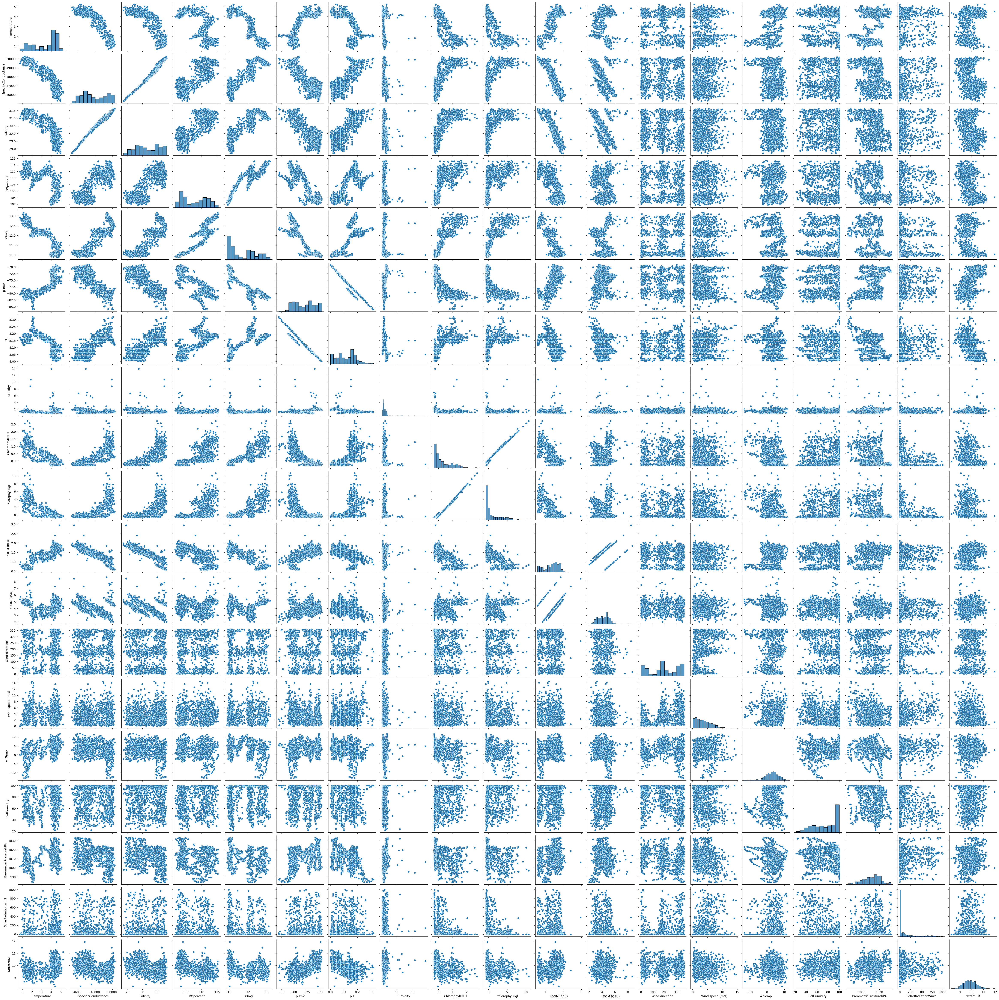

In [ ]:
sns.pairplot(river)

Fun story: this data was all gathered by a probe in the upper Daramiscotta river in Maine. Whenever the probe failed to get a good read on a given variable, it decided that the best number to enter was 999.9 or -999.9. I'm not sure why it went with that number instead of something lower and closer to the other gathered values, but it doesn't matter. After a significant amount of data pruning, I can see which variables dissolved oxygen has the greatest correlation with, and which ones don't influence dissolved oxygen at all.

In [ ]:
#many of these affect dissolved oxygen in some way, or I at least think they could.
X = river[["Temperature", "Salinity", "pH", "Chlorophyllugl", "NitrateuM", "AirTemp", "Turbidity","SolarRadiationWm2","fDOM (RFU)"]]
Y = river["DOmgl"]

I'm using those variables to start. All of my models will be run using normal likelihoods, because when I'm dealing with natural data I find that a normal usually models it well. After I run the model, I'll use a VI plot to try and figure out which variables to keep and which to cut. I have a pretty good idea of which ones contribute the most to dissolved oxygen, like temperature and chlorophyll, but some other ones I'm not too sure about.

#Model 1

In [ ]:
#Model 1 - using these variables.
with pm.Model() as model_river1:
    s = pm.HalfNormal('s',1000)
    μ_ = pmb.BART("μ_", X, np.log(Y), m=50)
    μ = pm.Deterministic("μ",pm.math.exp(μ_))
    #I'm using a Normal here because things relating to nature often
    y = pm.Normal("y", mu=μ, sigma=s,  observed=Y)
    idata_river1 = pm.sample(compute_convergence_checks=False)

Output()

Output()

<Axes: xlabel='y'>

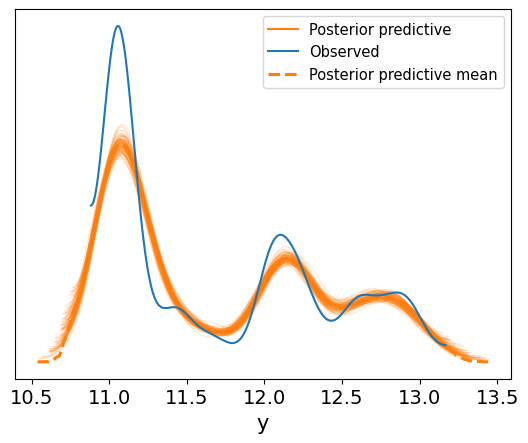

In [ ]:
pm.sample_posterior_predictive(idata_river1,model_river1, extend_inferencedata=True)
az.plot_ppc(idata_river1, num_pp_samples=100, colors=["C1", "C0", "C1"])

That's pretty good! It's actually way better than I was expecting, since I kind of threw in every variable I could think of and just applied a normal distribution. I'm going to run PDP, ICE, and VI plots now just to check and see if I can make this model even better.

# PDP, ICE, and VI

/usr/local/lib/python3.11/dist-packages/pymc_bart/utils.py:516: UserWarning: The grid is smaller than the number of available variables to plot.
                Automatically adjusting the grid size.
  warnings.warn(


array([<Axes: xlabel='X_0'>, <Axes: xlabel='X_1'>, <Axes: xlabel='X_2'>,
       <Axes: xlabel='X_3'>, <Axes: xlabel='X_4'>, <Axes: xlabel='X_5'>,
       <Axes: xlabel='X_6'>, <Axes: xlabel='X_7'>, <Axes: xlabel='X_8'>],
      dtype=object)

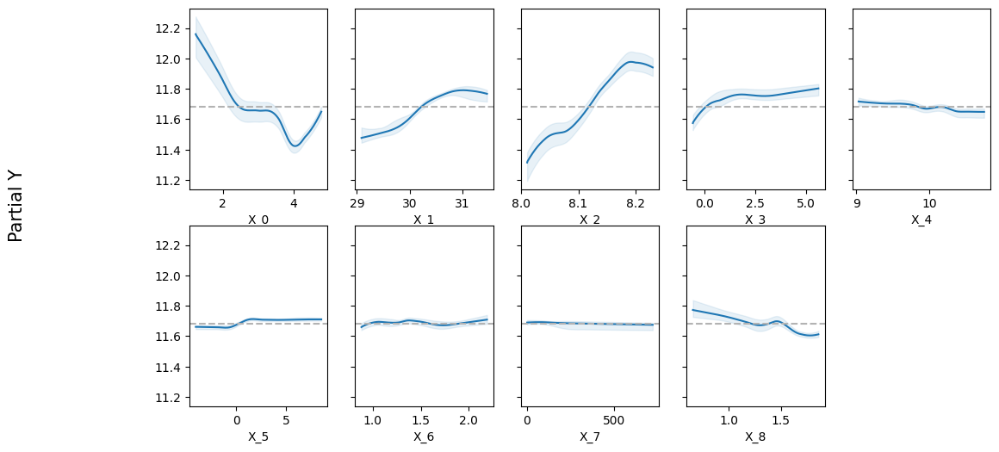

In [ ]:
pmb.plot_pdp(μ_, X, Y, grid=(1, 5), func=np.exp, figsize = (12,6))

The PDP says that Nitrate concentration, air temperature, water turbidity, and solar radiation have little effect on my model. I'm still going to run the other plots just to make sure these results are consistent, but I have a feeling I'm going to cut those four from my model.

/usr/local/lib/python3.11/dist-packages/pymc_bart/utils.py:516: UserWarning: The grid is smaller than the number of available variables to plot.
                Automatically adjusting the grid size.
  warnings.warn(


array([<Axes: xlabel='Temperature'>, <Axes: xlabel='Salinity'>,
       <Axes: xlabel='pH'>, <Axes: xlabel='Chlorophyllugl'>,
       <Axes: xlabel='NitrateuM'>, <Axes: xlabel='AirTemp'>,
       <Axes: xlabel='Turbidity'>, <Axes: xlabel='SolarRadiationWm2'>,
       <Axes: xlabel='fDOM (RFU)'>], dtype=object)

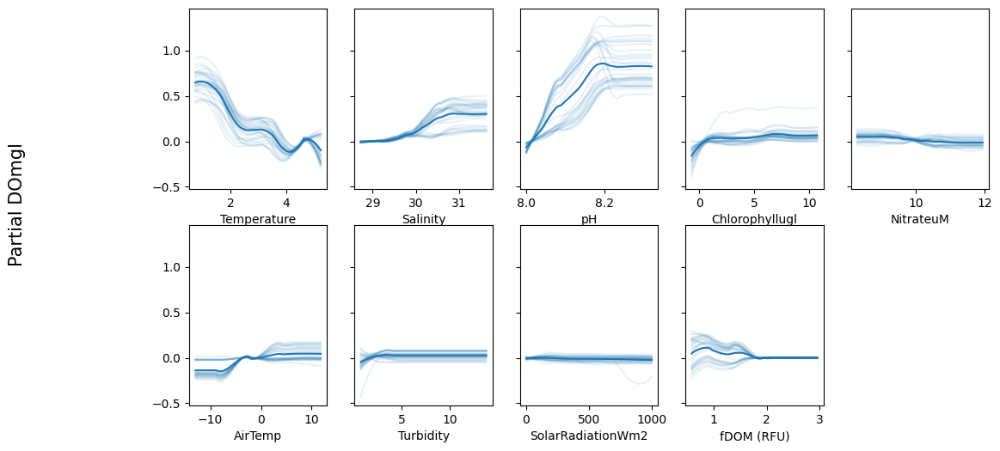

In [ ]:
pmb.plot_ice( μ_, X, Y, grid=(1, 5), func=np.exp, figsize = (12,6))

Something really interesting is happening with pH. I don't know why, but the sampling split at the beginning and went in two paths. I don't think that the weirdness there is too important, because of how direct of a positive trend there is, so I'm going to ignore it.

In other news, the ICE plot shows similar results to the PDP. Nitrate concentration, air temp, turbidity, and solar radiation seem like they have little effect on DO.

<Axes: ylabel='R²'>

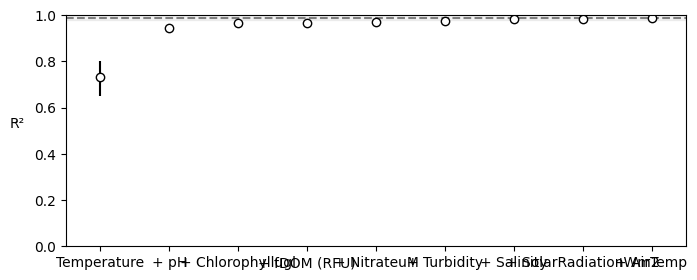

In [ ]:
vi_river1 = pmb.compute_variable_importance(idata_river1, μ_, X)
pmb.plot_variable_importance(vi_river1)

This VI plot gave me the information that temperature was the most important variable. I'll be cutting Nitrate concentration, solar radiation, and turbidity in this next model. The reason I'm not cutting air temperature is because of the interesting behavior shown in the ICE plot--it looks like there could still be some tiny correlation with DO.

With that being said, here are my final variables below:

In [14]:
X2 = river[["Temperature", "Salinity", "pH", "Chlorophyllugl","AirTemp","fDOM (RFU)"]].to_numpy()
Y2 = river["DOmgl"]

# Model 2
*electric boogaloo*

In [9]:
#Model 2 - This time using less variables
with pm.Model() as model_river2:
    s = pm.HalfNormal('s',1000)
    μ_ = pmb.BART("μ_", X2, np.log(Y2), m=50)
    μ = pm.Deterministic("μ",pm.math.exp(μ_))
    y = pm.Normal("y", mu=μ, sigma=s,  observed=Y2)
    idata_river2 = pm.sample(compute_convergence_checks=False)

Output()

Output()

<Axes: xlabel='y'>

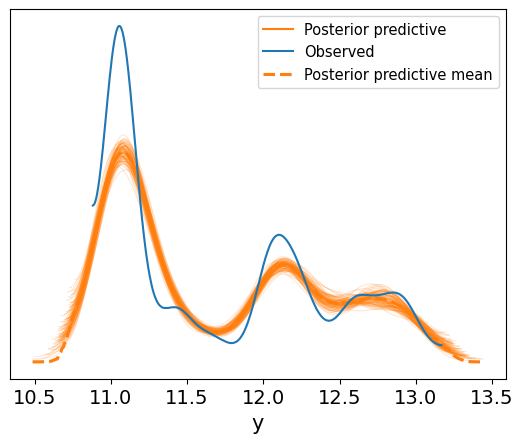

In [10]:
pm.sample_posterior_predictive(idata_river2,model_river2, extend_inferencedata=True)
az.plot_ppc(idata_river2, num_pp_samples=100, colors=["C1", "C0", "C1"])

The fact that this posterior predictive check turned out almost exactly the same is a good sign. It means that the variables I cut had little to do with Dissolved Oxygen, and removing them didn't effect the model. I don't think any of them directly harmed my model, but they didn't help either, so by removing them I just made a more consise model that runs quicker.

/usr/local/lib/python3.11/dist-packages/arviz/plots/hdiplot.py:166: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  hdi_data = hdi(y, hdi_prob=hdi_prob, circular=circular, multimodal=False, **hdi_kwargs)


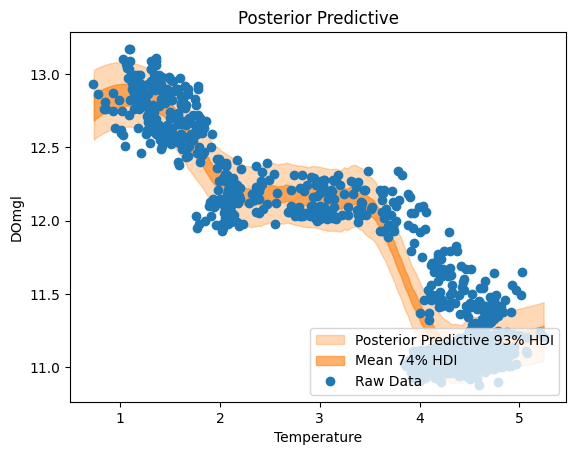

In [15]:
posterior_mean = idata_river2.posterior["μ"]

μ_hdi = az.hdi(ary=idata_river2, group="posterior", var_names=["μ"], hdi_prob=0.74)

pps = az.extract(idata_river2, group="posterior_predictive", var_names=["y"]).T

idx = np.argsort(X2[:, 0])
fig, ax = plt.subplots()

az.plot_hdi(
    x=X2[:, 0],
    y=pps,
    ax=ax,
    hdi_prob=0.93,
    fill_kwargs={"alpha": 0.3, "label": r"Posterior Predictive 93% HDI"},
)

az.plot_hdi(
    x=X2[:, 0],
    y=posterior_mean,
    ax=ax,
    hdi_prob=0.74,
    fill_kwargs={"alpha": 0.6, "label": r"Mean 74% HDI"},
)
ax.plot(river["Temperature"], river["DOmgl"], "o", c="C0", label="Raw Data")
ax.legend(loc="lower right")
ax.set(
    title="Posterior Predictive",
    xlabel="Temperature",
    ylabel="DOmgl",
);

This posterior predictive looks good!

# Conclusion

Dissolved oxygen is how fish (and all aquatic animals) breathe, so it's pretty important in the world of marine science. By running this model, I've learned what variables most directly influence dissolved oxygen content in water, water temperature and pH being the two most influential. Now, I don't know if you've seen what's been going on with the ocean lately, but the temperature is increasing and the pH is decreasing, both of which appear to affect dissolved oxygen in negative ways. If global warming and ocean acidification keep increasing at the rate they're going at now, then the dissolved oxygen in the water will stop being so dissolved. That's VERY bad for the things that need oxygen to live, which is--let me check--practically every animal in the world.

This dataset was really interesting to work with, excluding the time it took for me to get rid of all the probe's mistake values (the 999.9s). There are so many factors that rely on each other to create a balanced ecosystem for the organisms in the water, and they all affect each other in interesting ways. When temperature decreases, gases become more soluble in liquids, so it makes sense for colder water to have more DO. When I was doing my own DO tests in Maine last summer, I found the exact same trend--the surface water was a little colder than the bottom, and the water from the top had more oxygen dissolved in it. Seeing trends like these shown off on a much larger scale with something like this dataset is very interesting, and I'm glad I found it.

That's all for this project! Thanks for reading.